## Установка библиотек

In [ ]:
!pip install pandas==2.2.3 torch==2.5.1 torchvision==0.20.1 transformers==4.46.2 ultralytics==8.3.28 easyocr==1.7.2 textdistance==4.6.3 uvicorn==0.32.0 openpyxl==3.1.5 python-multipart==0.0.17 httpx==0.27.2 

## Загрузка тестового датасета

In [ ]:
!curl -L -O ...

## Обработка датасета

### подготовка необходимых классов

In [75]:
import torch
import textdistance


def device_detect():
    return 'cuda' if torch.cuda.is_available() else 'cpu'


# Функция для поиска наилучшего совпадения текста в базе данных
def find_best_match(text, database):
    if not isinstance(text, str):
        print("Warning: text is not a string:", text)
        return '', 0  # Возвращаем пустой результат, если text не строка

    best_ratio = 0
    best_match = ''
    for entry in database:
        if not isinstance(entry, str):
            print("Warning: entry is not a string:", entry)
            continue  # Пропускаем entry, если это не строка

        ratio = textdistance.levenshtein.normalized_similarity(text, entry)
        if ratio > best_ratio:
            best_ratio = ratio
            best_match = entry
    return best_match, best_ratio


In [76]:
import torch
from torch import nn
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel, pipeline
from ultralytics import YOLO
from PIL import Image
from typing import Literal, List
import easyocr
import numpy as np

device = device_detect()

def cylindrical_unwrap(image, center, radius, output_height=None):
    """
    Unwrap a circular region in an image into a rectangular strip using cv2.remap().

    :param image: Input image with a circular part.
    :param center: (x, y) coordinates of the circle's center.
    :param radius: Radius of the circular part.
    :param output_height: Desired height of the unwrapped image. Defaults to radius if not provided.
    :return: Unwrapped rectangular image.
    """
    if output_height is None:
        output_height = radius

    output_width = int(2 * np.pi * radius)

    # Create meshgrid for the output image
    theta = np.linspace(0, 2 * np.pi, output_width)
    h = np.linspace(0, radius, output_height)
    theta, h = np.meshgrid(theta, h)

    # Convert polar coordinates to Cartesian coordinates
    x_map = (center[0] + (radius - h) * np.cos(theta)).astype(np.float32)
    y_map = (center[1] + (radius - h) * np.sin(theta)).astype(np.float32)

    # Use cv2.remap to apply the mapping
    unwrapped_image = cv2.remap(
        image,
        x_map,
        y_map,
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=0
    )

    return unwrapped_image

def adjust_bounding_box_with_center_correction(x_min, y_min, x_max, y_max):
    # Calculate the width and height of the bounding box
    width = x_max - x_min
    height = y_max - y_min

    # Determine the smallest side
    side_length = min(width, height)

    # Calculate the center of the original bounding box
    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2

    # Adjust the center coordinate for the side that was larger
    if width > height:
        # Adjust the x_center to keep the new bounding box centered within the original width range
        x_center = (x_min + x_max - side_length/4) / 2
    elif height > width:
        # Adjust the y_center to keep the new bounding box centered within the original height range
        y_center = (y_min + y_max - side_length/4) / 2

    # Return the corrected center coordinates and the adjusted side length
    return x_center, y_center, side_length

from transformers import CLIPProcessor, CLIPModel
from torch import nn
from torchvision import transforms


class CLIPRotationClassifier(nn.Module):
    def __init__(self, num_classes=4, device='cuda'):
        super(CLIPRotationClassifier, self).__init__()
        self.clip_model = CLIPModel.from_pretrained('openai/clip-vit-base-patch32')
        self.fc = nn.Linear(self.clip_model.visual_projection.out_features, num_classes)
        self.rotations = [0, 90, 180, 270]

        def preprocess(image):
            return processor(images=image, return_tensors="pt")['pixel_values'].squeeze()
        
        processor = CLIPProcessor.from_pretrained('openai/clip-vit-base-patch32')
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            preprocess
        ])
        self.transform = transform
        self.device = device

    def forward(self, pixel_values):
        image_features = self.clip_model.get_image_features(pixel_values=pixel_values)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        logits = self.fc(image_features)
        return logits

    # Prediction Function
    def predict_rotation(self, image_pil):
        image = image_pil.convert('RGB')
        image_tensor = self.transform(image).unsqueeze(0).to(self.device)
    
        self.eval()
        with torch.no_grad():
            logits = self(image_tensor)
            _, predicted = torch.max(logits, 1)
            predicted_rotation = self.rotations[predicted.item()]
            rotation_needed = (360 - predicted_rotation) % 360
        img = image.rotate(rotation_needed)
        return img


class MarkingOCR:
    def __init__(self, yolo_model_path:str, 
                 db:list[str],
                 rotation_model_clf:CLIPRotationClassifier,
                 device:str = None, 
                 ocr_type:Literal['simple', 'efficient'] = 'efficient',
                 path_to_efficient_ocr_model = None,
                 circle_corection:bool=True
                ):

        assert ocr_type in ['simple', 'efficient'], f'unknown ocr_type type: {ocr_type}\n available options: [simple, efficient]'

        self.db = db
        self.rotation_model_clf = rotation_model_clf
        self.device = device if device else self._device_detect()
        print(f'set device {self.device}')
        
        self.detect_model = YOLO(yolo_model_path)
        print('init detection model')
        
        self.ocr_type = ocr_type
        if self.ocr_type == 'efficient':
            
            model_name = path_to_efficient_ocr_model if path_to_efficient_ocr_model else "microsoft/trocr-large-stage1"
            self.ocr_model = pipeline("image-to-text", model=model_name, device=self.device)
            print('init heavy ocr model')
        elif self.ocr_type == 'simple':
            reader = easyocr.Reader(['ru']) 
            self.ocr_model = reader.readtext
            print('init light ocr model')
        if circle_corection:
            self.circle_corection = circle_corection
            self.circle_detection = YOLO('yolov8m-worldv2.pt')
            self.circle_detection.set_classes(['circle object'])
            print('init circle detection model')
    
        #TODO: add many detection

    def _device_detect(self):
        if torch.cuda.is_available:
            return 'cuda'
        else:
            return 'cpu'
    
    @staticmethod
    def post_detect_processing(yolo_predict):
        boxes = yolo_predict.boxes  # Получаем координаты боксов
        image = yolo_predict.orig_img
        # Список для хранения вырезанных участков
        cropped_images = []
        
        if len(boxes) == 0:
            # print("Боксов не обнаружено на изображении.")
            return image
        # Вырезание каждого бокса из изображения
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cropped_image = image[y1:y2, x1:x2]
            cropped_images.append(cropped_image)
        
        # Соединение вырезанных изображений последовательно
        if len(cropped_images) > 1:
            # Определяем общую ширину и высоту для объединенного изображения
            total_height = sum(img.shape[0] for img in cropped_images)
            max_width = max(img.shape[1] for img in cropped_images)
        
            # Создаем пустое изображение для объединения
            combined_image = np.zeros((total_height, max_width, 3), dtype=np.uint8)
        
            # Заполняем объединенное изображение
            y_offset = 0
            for img in cropped_images:
                height = img.shape[0]
                combined_image[y_offset:y_offset + height, :img.shape[1]] = img
                y_offset += height
        else:
            # Если только одно изображение, просто используем его
            combined_image = cropped_images[-1]
        return combined_image

    def find_best_match(self, text):
        # Поиск наиболее похожей строки в базе
        best_ratio = 0
        best_match = ''
        for _, entry in self.db.iterrows():
            ratio = textdistance.levenshtein.normalized_similarity(text, entry['ДетальАртикул'])
            # ratio = SequenceMatcher(None, text, entry).ratio()
            if ratio > best_ratio:
                best_ratio = ratio
                best_match = entry
                best_info = entry
        return best_match

    def detect(self, images_list):
        datect_result = self.detect_model(images_list, agnostic_nms=True, iou=0.8)
        crop_marking_text = [self.post_detect_processing(x) for x in datect_result]
        return crop_marking_text, datect_result

    def ocr(self, image_with_texts):
        
        if self.ocr_type == 'efficient':
            if not isinstance(image_with_texts[0], Image.Image):
                image_with_texts = [Image.fromarray(x) for x in image_with_texts]
            extracted_text = self.ocr_model(image_with_texts)
            extracted_text = [x[0]['generated_text'] for x in extracted_text]
        else:
            extracted_text = [self.ocr_model(text) for text in image_with_texts]
            extracted_text =  [' '.join([item[1] for item in sublist]) for sublist in extracted_text]
        
        return extracted_text

    def recognition(self, images:list[str], 
                    postprocessing_image:bool=False):
        if self.circle_corection:
            circles_detect = self.circle_detection(images)
            images = []
            for predict in circles_detect:
                image = predict.orig_img
                if len(predict):
                    center_x, center_y, diametr = adjust_bounding_box_with_center_correction(*predict.boxes.xyxy.tolist()[0])
                    unwrapped_image = cylindrical_unwrap(image, (int(center_x), int(center_y)), int(diametr/2))
                    images.append(unwrapped_image)
                else:
                    images.append(image)
            print('unwrapped circle images')
            
        if postprocessing_image:
            
            preprocessed_images = [self.rotation_model_clf.predict_rotation(Image.open(x) if isinstance(x, str) else Image.fromarray(x)) 
                                   for x in images]
            print('rotated images')
        
        croped_images, bboxes = self.detect(preprocessed_images)
        print('detect text')
        
        texts = self.ocr(croped_images)
        print('OCR')
        best_match = [(self.find_best_match(text), text) for text in texts]
        return best_match, bboxes

    def __callable__(self, images:list[str]):
        return self.recognition(images)

In [77]:
def get_inference_class(yolo_model_path,
                        db_excel_path,
                        path_to_rotate_model,
                        path_to_efficient_ocr_model = None,
                        device='cuda'
                       ):
    rot_model = CLIPRotationClassifier()
    rot_model.load_state_dict(torch.load(path_to_rotate_model, weights_only=True))
    rot_model.eval()
    rot_model.to(device)

    db = pd.read_excel(db_excel_path)
    recognitor = MarkingOCR(yolo_model_path = yolo_model_path, db=db, rotation_model_clf=rot_model, 
                        path_to_efficient_ocr_model=path_to_efficient_ocr_model)
    return recognitor

In [78]:
import os
import shutil
import zipfile
import pandas as pd
from typing import List
from pydantic import BaseModel

class PredictionResponse(BaseModel):
    image_file: str
    best_match: str
    label_text: str
    boxes: list

In [79]:
db_path = 'api/data/database.xlsx'
model_path = 'api/models/best.pt'
clip_path = 'api/models/clip_rotation_classifier.pth'

recognitor = get_inference_class(yolo_model_path = model_path,
                                db_excel_path=db_path,
                                path_to_rotate_model=clip_path,
                                # path_to_efficient_ocr_model='./tuned_trocr_model'
                                )

set device cuda
init detection model


Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "qkv_bias": false,
  "transformers_version": "4.46.2"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_heads": 16,
  "decoder_ffn_dim": 4096,
  "decoder_layerdrop": 0.0,
  "decoder_layers":

init heavy ocr model
init circle detection model


In [80]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image

def plot_bboxes(results):
    if not len(results):
        return results[0].orig_img
    img = results[0].orig_img # original image
    names = results[0].names # class names dict
    
    scores = results[0].boxes.to('cpu').conf.numpy() # probabilities
    classes = results[0].boxes.to('cpu').cls.numpy() # predicted classes
    boxes = results[0].boxes.to('cpu').xyxy.numpy().astype(np.int32) # bboxes
    for score, cls, bbox in zip(scores, classes, boxes): # loop over all bboxes
        class_label = names[cls] # class name
        label = f"{class_label} : {score:0.2f}" # bbox label
        lbl_margin = 3 #label margin
        img = cv2.rectangle(img, (bbox[0], bbox[1]),
                            (bbox[2], bbox[3]),
                            color=(0, 0, 255),
                            thickness=1)
        label_size = cv2.getTextSize(label, # labelsize in pixels 
                                     fontFace=cv2.FONT_HERSHEY_SIMPLEX, 
                                     fontScale=1, thickness=1)
        lbl_w, lbl_h = label_size[0] # label w and h
        lbl_w += 2* lbl_margin # add margins on both sides
        lbl_h += 2*lbl_margin
        img = cv2.rectangle(img, (bbox[0], bbox[1]), # plot label background
                             (bbox[0]+lbl_w, bbox[1]-lbl_h),
                             color=(0, 0, 255), 
                             thickness=-1) # thickness=-1 means filled rectangle
        cv2.putText(img, label, (bbox[0]+ lbl_margin, bbox[1]-lbl_margin), # write label to the image
                    fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                    fontScale=1.0, color=(255, 255, 255 ),
                    thickness=1)
    return img

In [81]:
def predict(file: str):
    temp_dir = "temp_upload"
    os.makedirs(temp_dir, exist_ok=True)
    predictions = []

    try:
        # Проверяем, является ли файл zip-архивом по расширению
        if file.lower().endswith(".zip"):
            with zipfile.ZipFile(file, 'r') as zip_ref:
                zip_ref.extractall(temp_dir)
            # os.remove(file)  # Удаляем zip-файл после извлечения
        elif file.lower().endswith((".jpg", ".jpeg", ".png")):
            pass
        else:
            raise Exception('Нужно передать изображение или архив zip с изображениями')

        # Получаем список всех изображений в временной директории
        images_list = [os.path.join(temp_dir, f) for f in os.listdir(temp_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if not images_list:
            raise Exception('Нужно передать изображение или архив zip с изображениями')

        # Проверяем результат распознавания
        # _, detect_bboxes = recognitor.detect(images_list)
        results, detect_bboxes = recognitor.recognition(images_list, postprocessing_image=True)
        print(f"Тип results: {type(results)}, Пример данных results: {results[:2]}")  # Проверка типа и примера данных в results

        # Формируем ответ
        for img_path, (best_match, extracted_text), box in zip(images_list, results, detect_bboxes):
            filename = os.path.basename(img_path)
            try:
                best_match = best_match['ДетальАртикул']
            except:
                best_match = ''
            predict = PredictionResponse(
                image_file=filename,
                best_match=best_match,
                label_text=extracted_text,
                boxes=box
            )
            predictions.append(predict)            

            image = cv2.imread(img_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            if box:
                img = plot_bboxes(box)
                Image.fromarray(img).show()
            else:
                print('текст не размечен')

            print('----------------------')

    except Exception as e:
        print(e)
        raise Exception('что-то пошло не так')
    finally:
        shutil.rmtree(temp_dir, ignore_errors=True)

    return predictions

### предикт


0: 640x640 1 circle object, 6.7ms
1: 640x640 (no detections), 6.7ms
2: 640x640 1 circle object, 6.7ms
3: 640x640 (no detections), 6.7ms
4: 640x640 (no detections), 6.7ms
5: 640x640 (no detections), 6.7ms
6: 640x640 (no detections), 6.7ms
7: 640x640 (no detections), 6.7ms
8: 640x640 1 circle object, 6.7ms
9: 640x640 (no detections), 6.7ms
10: 640x640 (no detections), 6.7ms
11: 640x640 (no detections), 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)
unwrapped circle images
rotated images

0: 640x640 (no detections), 2.7ms
1: 640x640 2 class_0s, 2.7ms
2: 640x640 1 class_0, 2.7ms
3: 640x640 1 class_0, 2.7ms
4: 640x640 1 class_0, 2.7ms
5: 640x640 2 class_0s, 2.7ms
6: 640x640 1 class_0, 2.7ms
7: 640x640 (no detections), 2.7ms
8: 640x640 (no detections), 2.7ms
9: 640x640 1 class_0, 2.7ms
10: 640x640 1 class_0, 2.7ms
11: 640x640 2 class_0s, 2.7ms
Speed: 2.1ms preprocess, 2.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640

/home/user1/nv/venv/lib/python3.10/site-packages/transformers/generation/utils.py:1375: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


OCR
Тип results: <class 'list'>, Пример данных results: [(ДетальАртикул         "195-30-1285 ТС9 Пр."
ПорядковыйНомер                         0.0
ДетальНаименование      "ДетальЦБ-00127757"
ЗаказНомер                    "201015736  "
СтанцияБлок            АЭС Эль-Дабаа_блок 2
Name: 3114, dtype: object, '50259 6984'), (ДетальАртикул            "AM116.04.00.001"
ПорядковыйНомер                        0.0
ДетальНаименование     "ДетальЦБ-00131139"
ЗаказНомер                   "201016785  "
СтанцияБлок           АЭС Эль-Дабаа_блок 3
Name: 4532, dtype: object, 'FALL')]
текст не размечен
----------------------


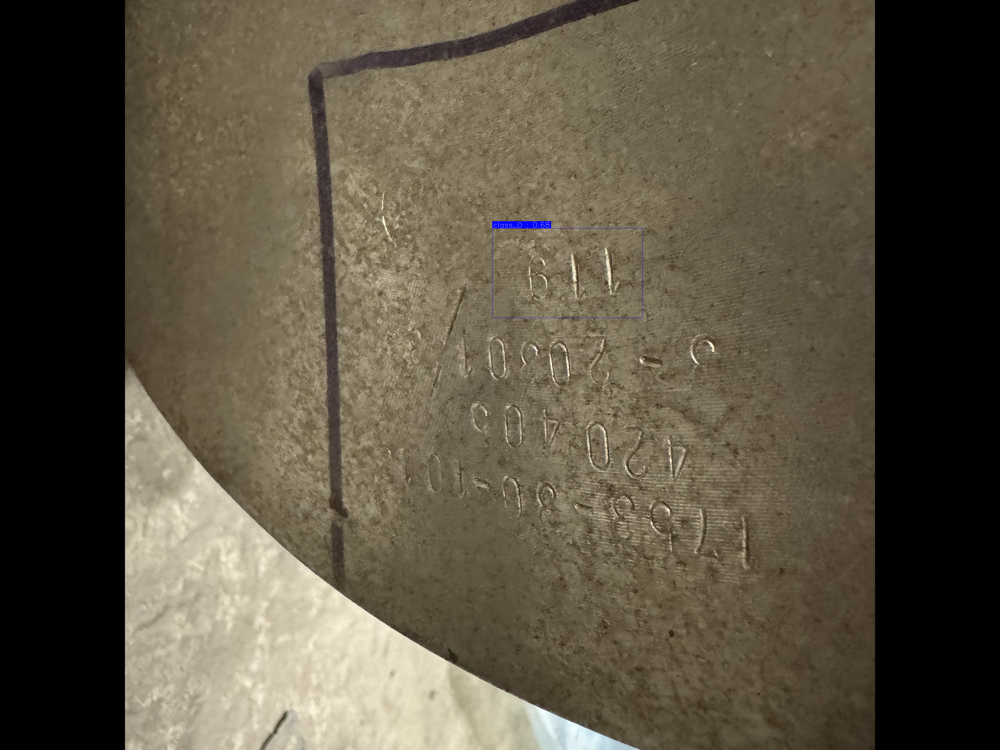

----------------------


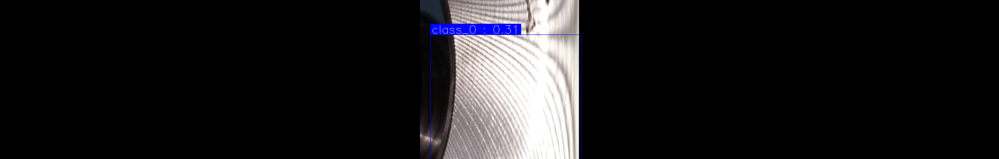

----------------------


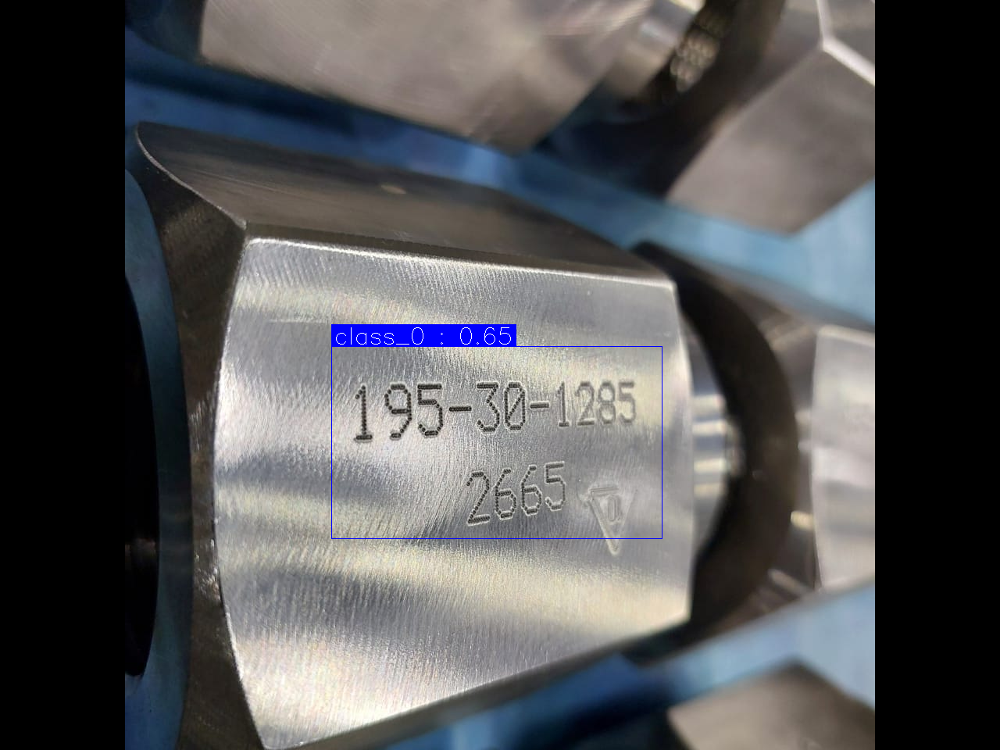

----------------------


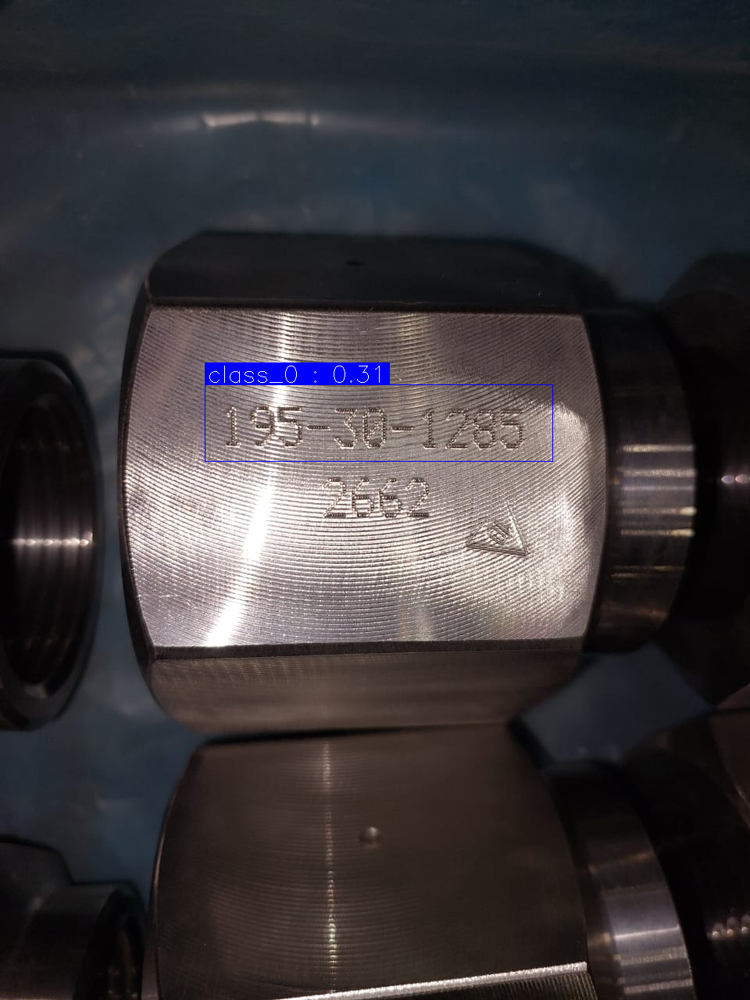

----------------------


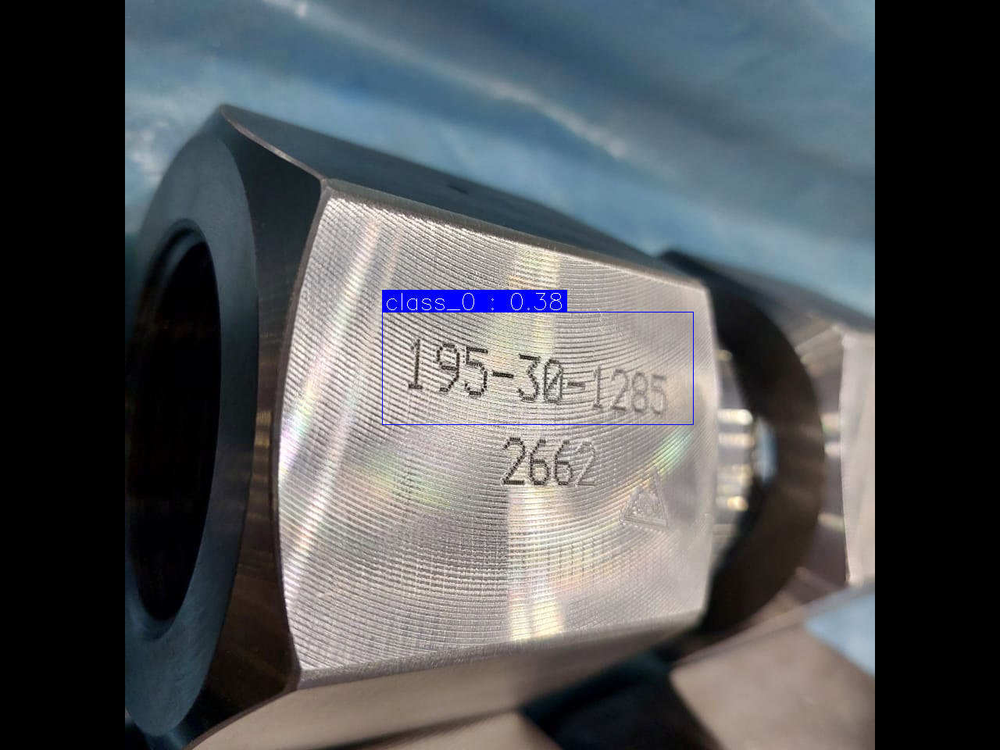

----------------------


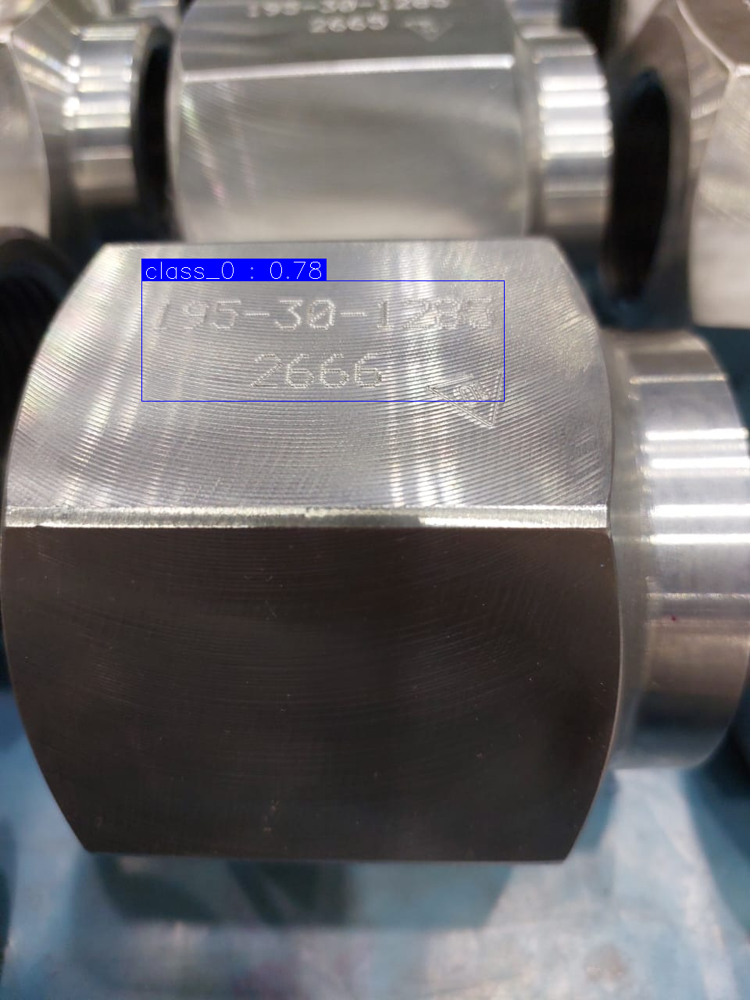

----------------------
текст не размечен
----------------------
текст не размечен
----------------------


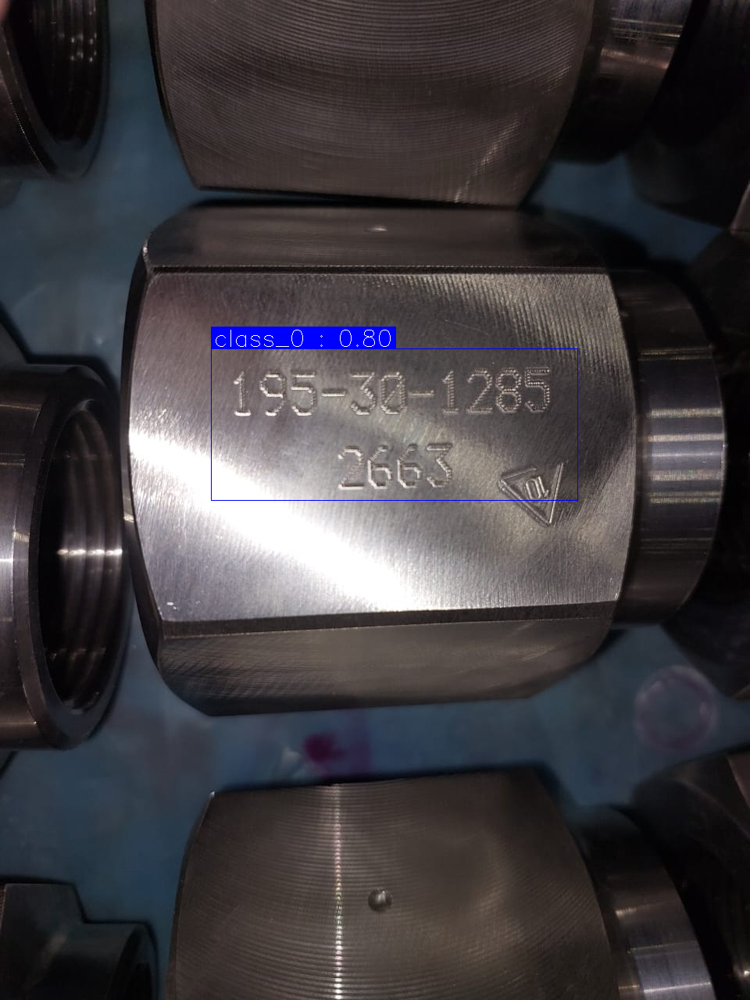

----------------------


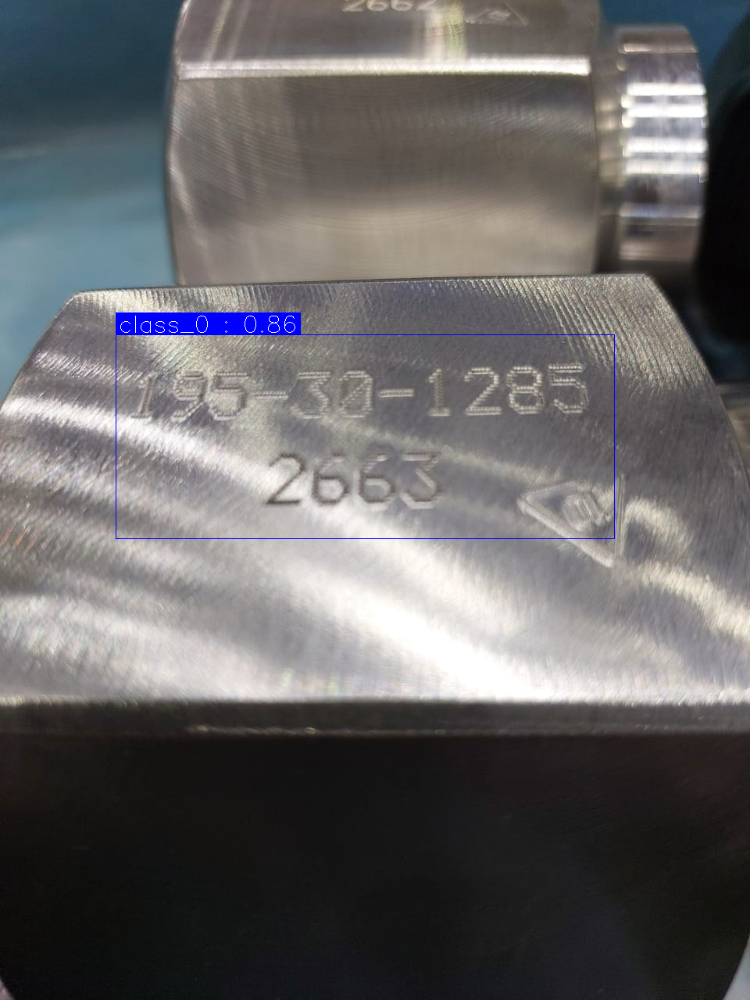

----------------------


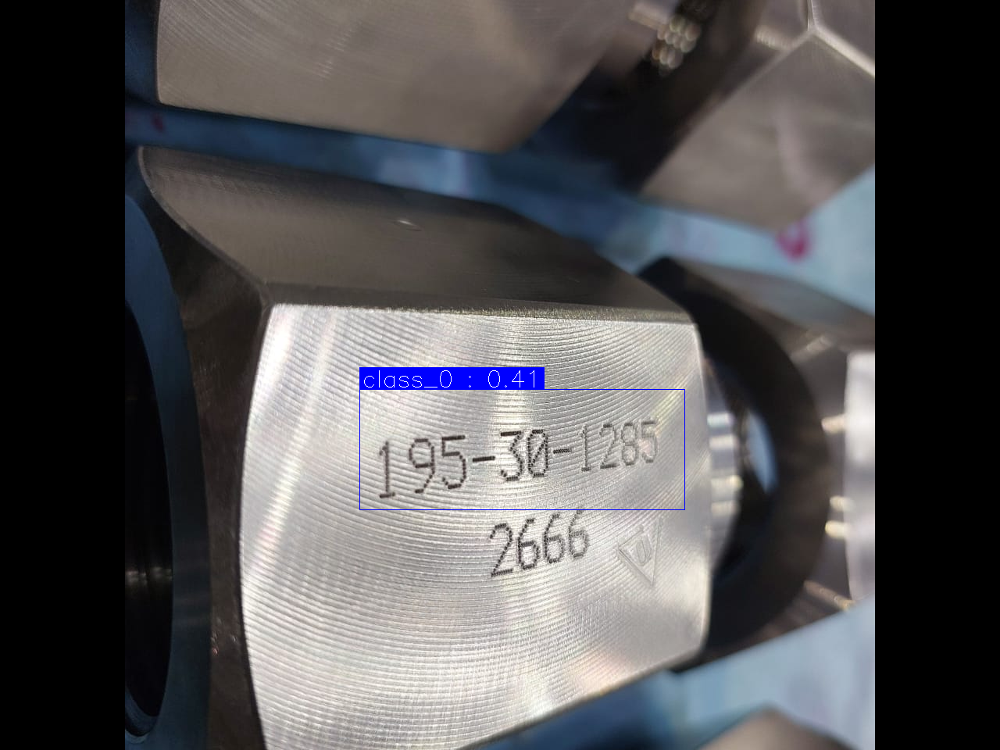

----------------------
CPU times: user 29.7 s, sys: 205 ms, total: 29.9 s
Wall time: 29.8 s


In [82]:
%%time
file = 'api/data/Архив.zip'
p = predict(file)

## Генерация сабмит-файла

In [84]:
df = pd.DataFrame([x.dict() for x in p])

In [85]:
df['label'] = df['boxes'].apply(lambda x: ' '.join(['0 ' + ' '.join(map(str, y.boxes.xywh.cpu().tolist()[0])) for y in x]))

In [87]:
df.drop(['boxes', 'label_text'], axis=1, inplace=True)

df = df.rename(columns={'best_match': 'label_text'})

In [ ]:
df[['image_file', 'label', 'label_text']].to_csv('submission.csv', sep=',', index=False)